In [1]:
import anndata as ad
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

from scipy.stats import pearsonr
from scipy.stats import spearmanr

import seaborn as sns
import gseapy as gp
import matplotlib.colors as mcolors

# Cluster Level

In [2]:
fdata = ad.read_h5ad("./RNA/Multitime.clustered.h5")
cdata = ad.read_h5ad("./RNA/Multitime.filtered.guide.bin100.h5")

In [3]:
cdata.obs.marker = cdata.obs.marker.map({
    'B926-1': '2-1',
    'B926-2': '2-2',
    'B924-1': '1-1',
    'B924-2': '1-2',
    'B922-1': '3-1',
    'B922-2': '3-2'
})

fdata.obs['coord_x'] = fdata.obsm['spatial'][:, 0] // 100 * 100
fdata.obs['coord_y'] = fdata.obsm['spatial'][:, 1] // 100 * 100

cdata.obs['coord_x'] = cdata.obsm['spatial'][:, 0] // 100 * 100
cdata.obs['coord_y'] = cdata.obsm['spatial'][:, 1] // 100 * 100
fdata.obs_names = [str(marker) + '_' + str(x) + '_' + str(y) for marker, x, y in zip(fdata.obs['marker'], fdata.obs['coord_x'], fdata.obs['coord_y'])]
cdata.obs_names = [str(marker) + '_' + str(x) + '_' + str(y) for marker, x, y in zip(cdata.obs['marker'], cdata.obs['coord_x'], cdata.obs['coord_y'])]

common_bins = np.intersect1d(fdata.obs_names, cdata.obs_names)
fdata = fdata[common_bins].copy()
cdata = cdata[common_bins].copy()

In [4]:
from bin import utils
cdata = utils.combine_guide_replicates(cdata)

/home/wpy/stereoseq/20240502-SPACseq/bin/utils.py:88: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sgs_grouped = sgs_grouped.groupby(sgs, axis=1).sum()


In [5]:
cdata.obs["cluster_cellcharter_givenk"] = fdata.obs["cluster_cellcharter_givenk"].tolist()
guide_cluster_counts = pd.DataFrame(cdata.X)
guide_cluster_counts.columns = cdata.var_names
guide_cluster_counts["cluster"] = cdata.obs["cluster_cellcharter_givenk"].tolist()

guide_total_counts = guide_cluster_counts.sum(axis=0)[:-1]
guide_cluster_proportions = guide_cluster_counts.groupby(["cluster"]).sum()
guide_cluster_proportions = guide_cluster_proportions.div(guide_total_counts, axis=1)
guide_cluster_proportions.index = guide_cluster_proportions.index.astype(int)
guide_cluster_proportions = guide_cluster_proportions.T.reindex(sorted(guide_cluster_proportions.index), axis=1)
for i in range(12): guide_cluster_proportions[i] = guide_cluster_proportions.convert_dtypes().loc[:, i].astype(float).to_list()
guide_matrix = np.matrix(guide_cluster_proportions).T

In [18]:
rho = spearmanr(np.hstack((guide_matrix, grouped_sum)), axis=0)[0]

In [19]:
def row_wise_pearson(x, y):
    mean_x = np.mean(x, axis=1, keepdims=True)
    mean_y = np.mean(y, axis=1, keepdims=True)
    x_centered = x - mean_x
    y_centered = y - mean_y
    covariance = np.sum(x_centered * y_centered, axis=1)
    std_x = np.std(x, axis=1)
    std_y = np.std(y, axis=1)
    correlation = covariance / (std_x * std_y * x.shape[1])
    return correlation

In [20]:
corr_matrix = rho[:guide_matrix.shape[1], guide_matrix.shape[1]:guide_matrix.shape[1]+grouped_sum.shape[1]]

In [149]:
np.savetxt("./cluster.spearmanr.txt", corr_matrix, fmt="%6f")

In [63]:
corr_matrix = np.loadtxt("./cluster.spearmanr.txt")

In [21]:
high_correlated_gene = []
low_correlated_gene = []
for i in range(34):
    guide_vec = corr_matrix[i]
    mu = np.mean(guide_vec)
    std = np.std(guide_vec)
    z = (guide_vec - mu) / std

    high_correlated = (z > np.quantile(z, 0.999))
    low_correlated = (z < np.quantile(z, 0.001))
    high_correlated_gene += (fdata.var_names[high_correlated].tolist())
    low_correlated_gene += (fdata.var_names[low_correlated].tolist())
high_correlated_gene = set(high_correlated_gene)
low_correlated_gene = set(low_correlated_gene)
print("high:", len(high_correlated_gene), ", low:", len(low_correlated_gene))

high: 95 , low: 43


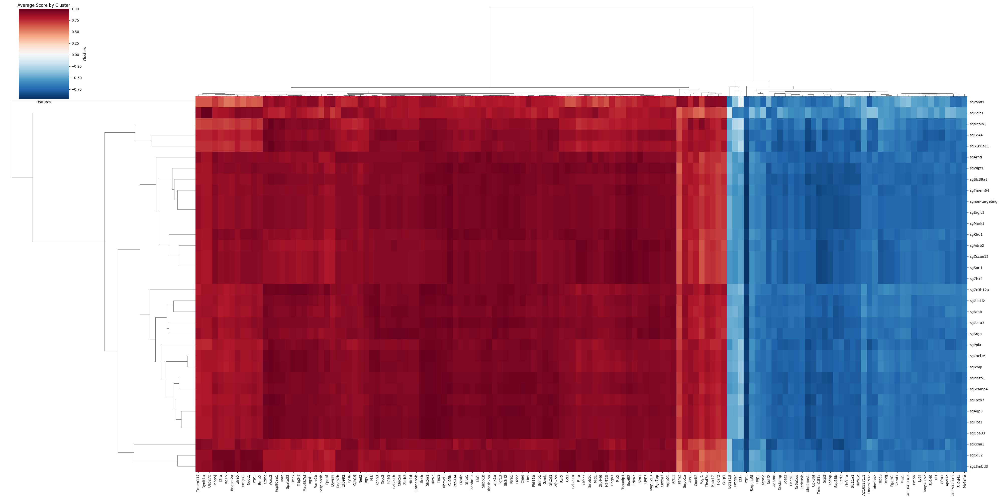

In [22]:
interest_gene = high_correlated_gene.union(low_correlated_gene)
interest_matrix = corr_matrix[:, np.isin(fdata.var_names, list(interest_gene))]
interest_df = pd.DataFrame(interest_matrix)
interest_df.index = cdata.var_names
interest_df.columns = list(interest_gene)

sns.clustermap(interest_df, annot=False, fmt=".2f", cmap="RdBu_r", figsize=(40, 20))

plt.title('Average Score by Cluster')
plt.xlabel('Features')
plt.ylabel('Clusters')
plt.show()

# Bin Level

In [61]:
pval_cutoff = 0.05
top_n = 200

result = fdata.uns['rank_genes_groups']
groups = result['names'].dtype.names

top_genes_df = pd.DataFrame()

for group in groups:
    genes = result['names'][group]
    log2fc = result['logfoldchanges'][group]
    padj = result['pvals_adj'][group]
    score = result['scores'][group]
    
    data = pd.DataFrame({
        'Gene': genes,
        'l2fc': log2fc,
        'padj': padj,
        'score': score,
        'Cluster': group
    })
    
    filtered_data = data[data['padj'] < pval_cutoff]
    sorted_data = filtered_data.sort_values(by='padj', ascending=True)
    top_genes = sorted_data.head(top_n)
    top_genes_df = pd.concat([top_genes_df, top_genes], ignore_index=True)

degs = top_genes_df["Gene"].unique().tolist()

/tmp/ipykernel_37284/1834004004.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_genes_heatmap_df = top_genes_df.groupby('Cluster').apply(lambda x: x.nlargest(50, 'l2fc')).reset_index(drop=True)


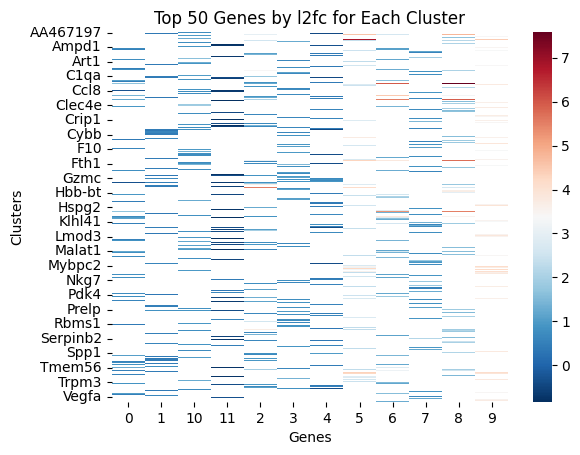

In [62]:
top_genes_heatmap_df = top_genes_df.groupby('Cluster').apply(lambda x: x.nlargest(50, 'l2fc')).reset_index(drop=True)
heatmap_data = top_genes_heatmap_df[["Cluster", "Gene", "l2fc"]].pivot(columns="Cluster", index="Gene", values="l2fc")

sns.heatmap(heatmap_data, cmap="RdBu_r")
plt.title('Top 50 Genes by l2fc for Each Cluster')
plt.xlabel('Genes')
plt.ylabel('Clusters')
plt.show()


In [63]:
cdf = pd.concat([pd.DataFrame(fdata[:, np.unique(top_genes_df.Gene)].X.toarray(), index=fdata.obs_names), pd.DataFrame(fdata.obs.cluster_cellcharter_givenk)], axis=1)
cdf = cdf.groupby('cluster_cellcharter_givenk').mean().div(cdf.iloc[:, :-1].mean(axis=0))
cdf.columns = np.unique(top_genes_df.Gene)
cdf

/tmp/ipykernel_37284/209254157.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cdf = cdf.groupby('cluster_cellcharter_givenk').mean().div(cdf.iloc[:, :-1].mean(axis=0))


,AA467197,AB124611,AC164314.2,AW112010,AY036118,Abca1,Abi3bp,Abra,Ackr3,Acod1,...,Xirp2,Xist,Ybx1,Ywhaz,Zbp1,Zbtb20,Zeb1,Zeb2,Zfp36l2,Zfp407
cluster_cellcharter_givenk,,,,,,,,,,,,,,,,,,,,,
0,0.889698,0.912616,0.904196,0.943180,1.021127,0.854746,0.604160,0.435562,0.638785,0.919256,...,0.585582,1.529952,1.050576,1.039219,0.936444,1.129475,1.432701,1.237898,1.114001,1.627036
1,0.976848,1.247424,0.832444,1.132231,0.564478,0.787183,0.665756,0.452301,0.550088,1.150181,...,0.472259,0.803314,0.964585,1.058452,1.041927,0.716486,0.792936,0.904862,0.809155,0.737153
2,0.936582,0.877704,0.417571,1.143756,1.682808,0.904574,0.874475,0.549180,0.837974,0.648057,...,0.614329,0.702187,0.721359,1.198609,0.825343,0.717677,0.856186,0.790233,0.453697,0.805422
3,1.179071,1.323326,1.993503,1.208850,0.401192,0.849287,0.532869,0.356088,0.477320,1.248457,...,0.365302,0.714859,1.156959,0.938254,1.312075,0.853587,0.750920,0.805383,1.452614,0.785685
4,1.116865,0.759563,0.831521,0.852378,0.703809,0.698994,0.529342,0.496060,0.721537,0.853456,...,0.577775,0.648356,1.009674,1.129330,0.877646,0.742528,0.779440,0.784769,0.866584,0.857758
5,0.666751,0.818956,0.509778,0.940844,2.103867,1.537255,2.313312,3.685833,2.570022,0.565883,...,3.073601,1.107260,0.901310,0.929839,0.742781,1.327094,0.855791,1.044505,0.789238,0.759165
6,0.841347,0.885730,0.728985,0.917798,1.652091,0.883983,0.824704,0.404817,0.585771,0.766215,...,0.739234,1.944749,1.151192,0.944389,0.978612,1.447396,1.916250,1.600075,1.034396,2.198026
7,1.252201,0.726605,1.471800,0.749129,0.655331,0.744657,0.515703,0.290279,0.507770,1.227446,...,0.410802,0.874566,1.086708,0.912666,1.169399,0.989871,1.140353,1.032402,1.498940,1.154149
8,0.690814,0.962039,0.619164,1.040563,2.178519,1.576919,2.807416,0.879319,2.825360,0.592783,...,0.933756,1.641774,0.911094,0.983863,0.938151,1.359958,1.270721,1.428524,0.797724,1.265362


In [64]:
cdf = cdf.div(cdf.sum(axis=1), axis=0)

In [17]:
np.matrix(cdf)

matrix([[0.00116362, 0.0011936 , 0.00118258, ..., 0.00161903, 0.00145698,
         0.00212797],
        [0.00137103, 0.0017508 , 0.00116836, ..., 0.00127   , 0.00113567,
         0.00103462],
        [0.00128887, 0.00120784, 0.00057463, ..., 0.00108747, 0.00062435,
         0.00110837],
        ...,
        [0.00047036, 0.00053146, 0.00055424, ..., 0.00084122, 0.00061861,
         0.00082161],
        [0.00179109, 0.00173812, 0.00129971, ..., 0.0012941 , 0.00139339,
         0.00097086],
        [0.00138865, 0.00129171, 0.00175804, ..., 0.00117562, 0.00155551,
         0.0011583 ]])

In [67]:
from sklearn.cluster import AgglomerativeClustering


AgglomerativeClustering?

Init signature:
AgglomerativeClustering(
    n_clusters=2,
    *,
    metric='euclidean',
    memory=None,
    connectivity=None,
    compute_full_tree='auto',
    linkage='ward',
    distance_threshold=None,
    compute_distances=False,
)
Docstring:     
Agglomerative Clustering.

Recursively merges pair of clusters of sample data; uses linkage distance.

Read more in the :ref:`User Guide <hierarchical_clustering>`.

Parameters
----------
n_clusters : int or None, default=2
    The number of clusters to find. It must be ``None`` if
    ``distance_threshold`` is not ``None``.

metric : str or callable, default="euclidean"
    Metric used to compute the linkage. Can be "euclidean", "l1", "l2",
    "manhattan", "cosine", or "precomputed". If linkage is "ward", only
    "euclidean" is accepted. If "precomputed", a distance matrix is needed
    as input for the fit method.

    .. versionadded:: 1.2

    .. deprecated:: 1.4
       `metric=None` is deprecated in 1.4 and will be removed in 1

In [68]:
from sklearn.cluster import AgglomerativeClustering
import consensusclustering
cc = consensusclustering.ConsensusClustering(
    clustering_obj=AgglomerativeClustering(metric='cosine', linkage='average'),
    min_clusters=30,
    max_clusters=32,
    n_resamples=200,
    resample_frac=0.8,
    k_param='n_clusters'
)
cc.fit(np.array(cdf.T), progress_bar=True)

Computing consensus matrices:   0%|          | 0/3 [00:00<?, ?it/s]

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


[265,
 570,
 235,
 179,
 415,
 163,
 567,
 625,
 278,
 608,
 643,
 177,
 288,
 388,
 453,
 99,
 544,
 781,
 729,
 804,
 449,
 652,
 259,
 802,
 512,
 726,
 197,
 124,
 347,
 450,
 661,
 89,
 135,
 262,
 708,
 185,
 19,
 621,
 538,
 553,
 763,
 210,
 578,
 619,
 211,
 470,
 138,
 172,
 682,
 740,
 793,
 519,
 523,
 812,
 27,
 226,
 598,
 680,
 147,
 255,
 635,
 688,
 397,
 370,
 713,
 71,
 702,
 238,
 157,
 681,
 72,
 247,
 196,
 66,
 386,
 742,
 35,
 631,
 69,
 774,
 787,
 254,
 762,
 270,
 103,
 126,
 592,
 60,
 788,
 664,
 501,
 531,
 91,
 84,
 360,
 56,
 407,
 377,
 36,
 446,
 743,
 776,
 337,
 413,
 136,
 719,
 358,
 419,
 113,
 365,
 571,
 396,
 709,
 241,
 42,
 198,
 733,
 527,
 746,
 100,
 191,
 543,
 545,
 560,
 783,
 644,
 707,
 645,
 728,
 498,
 784,
 20,
 231,
 336,
 62,
 331,
 599,
 351,
 371,
 65,
 121,
 428,
 359,
 524,
 594,
 219,
 404,
 738,
 86,
 556,
 562,
 662,
 285,
 476,
 308,
 613,
 289,
 212,
 600,
 253,
 670,
 343,
 649,
 22,
 114,
 381,
 267,
 205,
 263,
 586,


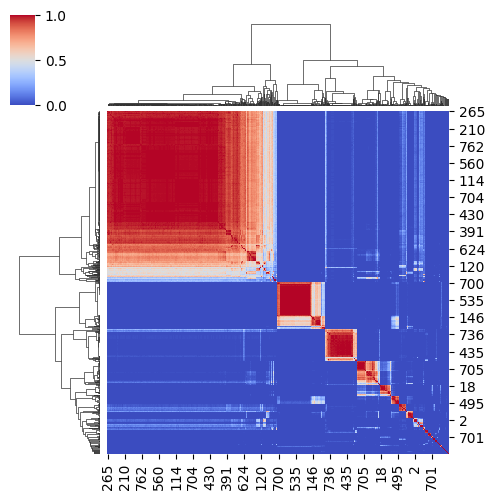

In [69]:
ax = cc.plot_clustermap(
    k=32,
    figsize=(5, 5),
    cmap='coolwarm',
    alpha=1
)
ax.dendrogram_col.reordered_ind

In [19]:
cmatrix = fdata[cdata.X.sum(axis=1) > 0, degs].X.toarray().T

In [20]:
pearson_matrix = np.zeros((cmatrix.shape[0], cmatrix.shape[0]))
for i in tqdm(range(cmatrix.shape[0])):
    for j in range(i, cmatrix.shape[0]):
        pearson_matrix[i, j] = pearsonr(cmatrix[i], cmatrix[j])[0]

100%|██████████| 819/819 [23:12<00:00,  1.70s/it]


In [22]:
np.save('./corr.npy', pearson_matrix)

In [6]:
pearson_matrix = np.load('./corr.npy')

In [7]:
p_matrix = pearson_matrix

In [8]:
for i in tqdm(range(p_matrix.shape[0])):
    for j in range(i + 1, p_matrix.shape[0]):
        p_matrix[j, i] = p_matrix[i, j]

100%|██████████| 819/819 [00:00<00:00, 5926.71it/s]


In [210]:
clusters = range(12)
cluster_size = len(clusters)
go_genes = []
for i in range(cluster_size):
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False).head(5)
    go_genes += results.Genes.str.split(';').sum()

In [211]:
def capitalize_first_letter(word_list):
    return [word[0].upper() + word[1:].lower() if len(word) > 1 else word.upper() for word in word_list]
go_genes = capitalize_first_letter(go_genes)

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


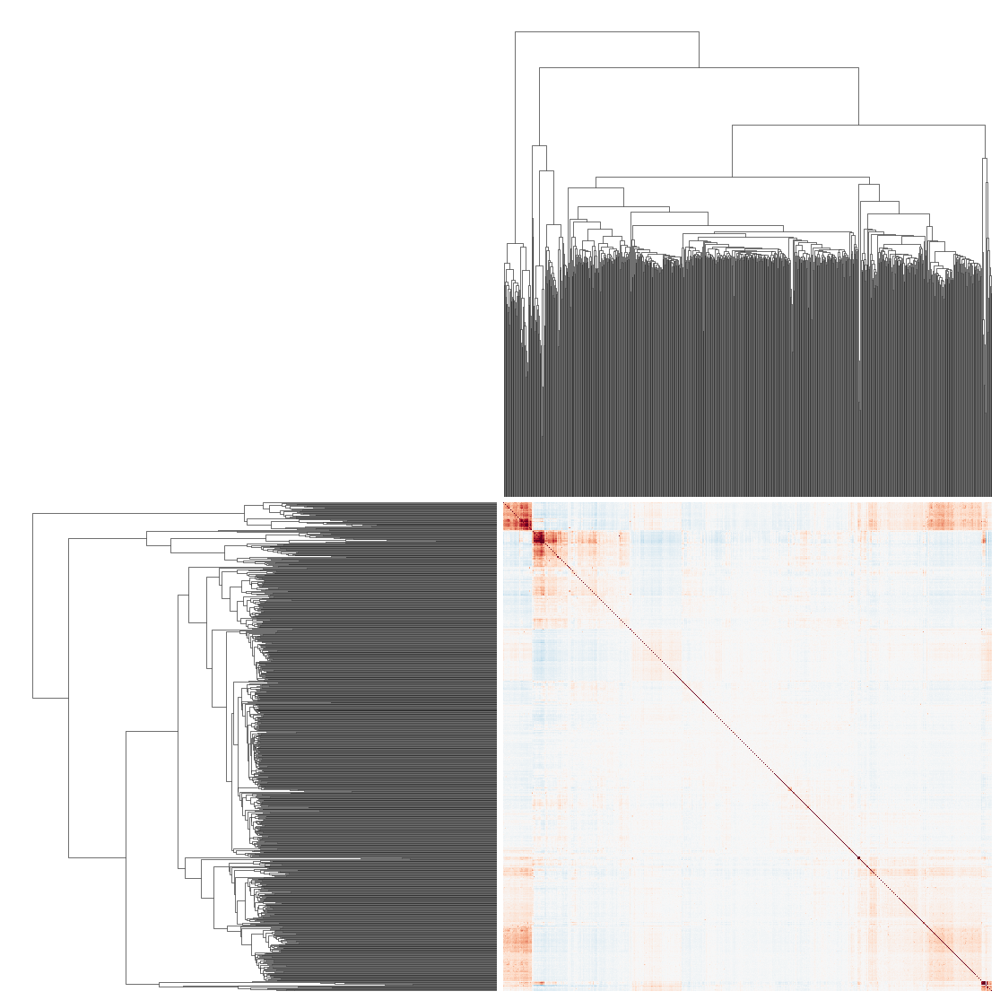

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from adjustText import adjust_text  # Import the adjustText library

p_df = pd.DataFrame(p_matrix, columns=fdata[cdata.X.sum(axis=1) > 0, degs].var_names, index=fdata[cdata.X.sum(axis=1) > 0, degs].var_names)

# Create the clustermap
g = sns.clustermap(p_df, vmax=0.5, vmin=-0.5, dendrogram_ratio=0.5, cbar_pos=None, figsize=(12, 12), cmap='RdBu_r')

# Get the heatmap axis
ax = g.ax_heatmap
ax.set_xticks([])
ax.set_yticks([])
plt.show()

In [12]:
# Assuming g is the clustermap object
column_order = g.dendrogram_col.reordered_ind

# Get the column names in the new clustered order
ordered_columns = p_df.columns[column_order]

print(ordered_columns)

Index(['Sln', 'Casq1', 'Hspb1', 'Pdlim3', 'Mustn1', 'Xirp2', 'Mybpc1',
       'Ankrd2', 'Hspb7', 'Csrp3',
       ...
       'Usmg5', 'Malat1', 'Jarid2', 'Tmtc2', 'Arhgap21', 'Peak1', 'Kpna1',
       'Hexb', 'Tmem56', 'Kcnip1'],
      dtype='object', length=819)


In [16]:
from scipy.cluster.hierarchy import fcluster

# Assuming 'col_linkage' contains the linkage matrix for the columns from the clustermap
col_linkage = g.dendrogram_col.linkage

# Set a distance threshold
threshold = 1.8  # You can adjust this value based on your dendrogram

# Use fcluster to get the cluster labels for each column based on the threshold
cluster_labels = fcluster(col_linkage, t=threshold, criterion='distance')

# Get the number of unique clusters
num_clusters = len(set(cluster_labels))

print(f"Number of clusters at threshold {threshold}: {num_clusters}")


Number of clusters at threshold 1.8: 11


In [20]:
g.dendrogram_col.linkage.shape

(818, 4)

In [14]:
row_linkage

array([[7.10000000e+01, 1.06000000e+02, 3.64392197e-01, 2.00000000e+00],
       [0.00000000e+00, 5.00000000e+00, 4.99880917e-01, 2.00000000e+00],
       [3.60000000e+01, 5.20000000e+01, 5.17880421e-01, 2.00000000e+00],
       ...,
       [1.63000000e+03, 1.63200000e+03, 2.19867495e+00, 7.12000000e+02],
       [1.63300000e+03, 1.63400000e+03, 2.53918583e+00, 7.72000000e+02],
       [1.58400000e+03, 1.63500000e+03, 2.75112067e+00, 8.19000000e+02]])

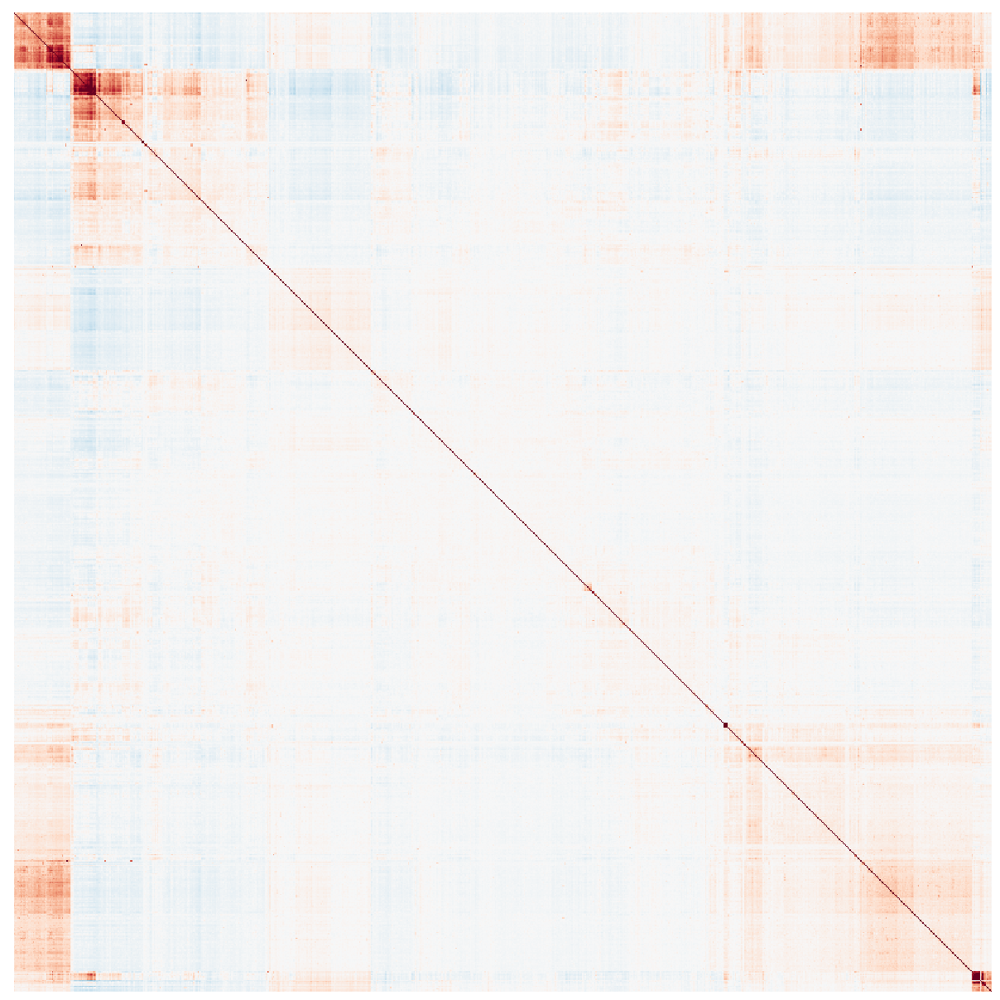

In [10]:
from scipy.spatial import distance
from scipy.cluster import hierarchy

p_df = pd.DataFrame(p_matrix, columns=fdata[cdata.X.sum(axis=1) > 0, degs].var_names, index=fdata[cdata.X.sum(axis=1) > 0, degs].var_names)
correlations = p_df
correlations_array = p_matrix

row_linkage = hierarchy.linkage(
    distance.pdist(correlations_array), method='average')

col_linkage = hierarchy.linkage(
    distance.pdist(correlations_array.T), method='average')

g = sns.clustermap(correlations, row_linkage=row_linkage, col_linkage=col_linkage, method="average", figsize=(13, 13), cmap='RdBu_r',
    vmax=0.5, vmin=-0.5, dendrogram_ratio=0.0001, cbar_pos=None)
ax = g.ax_heatmap
ax.set_xticks([])
ax.set_yticks([])
plt.show()

In [71]:
clusters = fcluster(col_linkage, t=1.8, criterion='inconsistent')
np.unique(clusters)

array([1], dtype=int32)

,index,column,cluster
0,39,Tnnt3,1
1,40,Tnni2,1
2,92,Lgals3,1
3,97,Hspa5,1
4,146,Sqstm1,1
...,...,...,...
814,115,Cfd,22
815,11,Actn2,22
816,63,B2m,22
817,19,Actn3,22


In [28]:
from consensusclustering import ConsensusClustering
from sklearn.cluster import AgglomerativeClustering
clustering_obj = AgglomerativeClustering(metric='euclidean', linkage='average')
cc = ConsensusClustering(
    clustering_obj=clustering_obj,
    min_clusters=8,
    max_clusters=20,
    n_resamples=200,
    resample_frac=0.8,
    k_param='n_clusters'
)
cc.fit(p_matrix, progress_bar=True)

Computing consensus matrices:   0%|          | 0/13 [00:00<?, ?it/s]

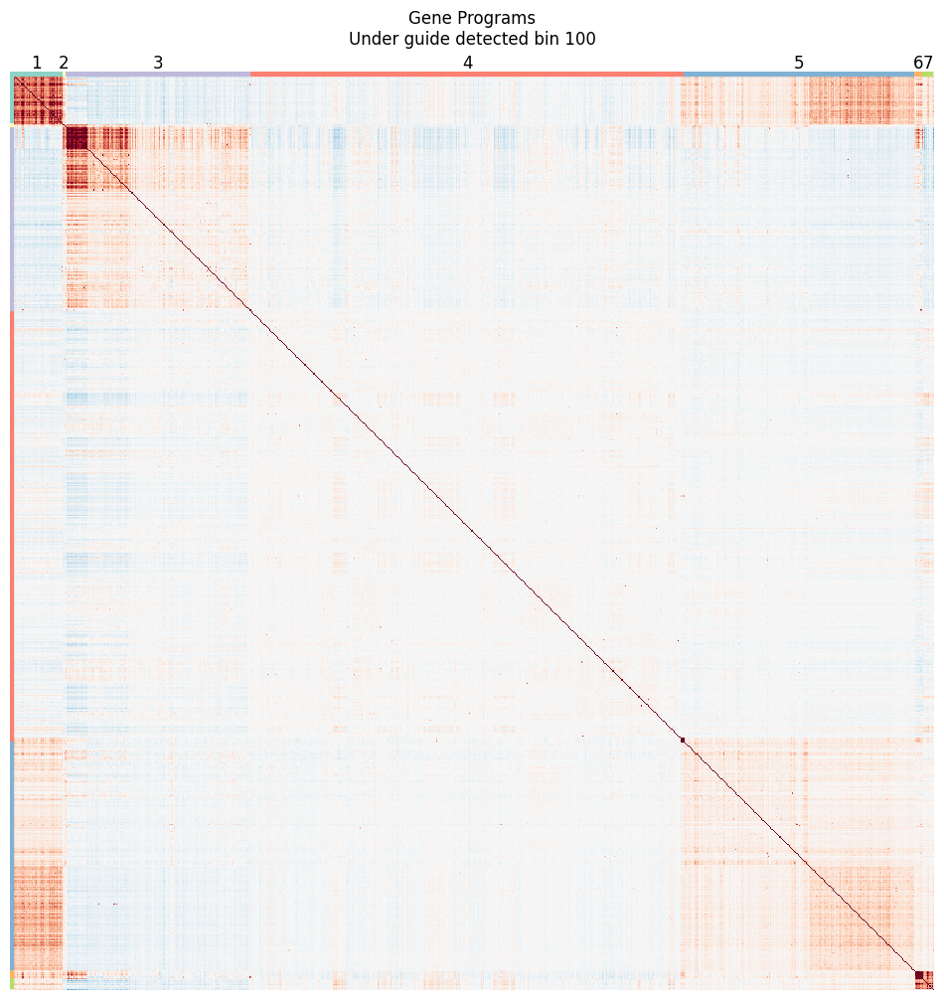

In [11]:
from scipy.cluster import hierarchy
from scipy.spatial import distance
from scipy.cluster.hierarchy import fcluster
from bin import consensus_cluster

correlations = p_df
correlations_array = p_matrix

row_linkage = hierarchy.linkage(
    distance.pdist(correlations_array), method='average')

col_linkage = hierarchy.linkage(
    distance.pdist(correlations_array.T), method='average')

# Divide the columns into 11 clusters
clusters = fcluster(col_linkage, t=15, criterion='maxclust')
# Colors for each cluster (adjust if needed)
cluster_colors = sns.color_palette("Set3", len(np.unique(clusters)))
lut = dict(zip(clusters, ['r'] * len(clusters)))

# Output the cluster assignments
# print(clusters)

# Get the column names with their respective cluster labels
column_names = p_df.columns
clustered_columns = pd.DataFrame({
    'id': list(range(len(clusters))),
    'column': column_names,
    'cluster': clusters
})
# Sort by cluster
clustered_columns = clustered_columns.sort_values(by='cluster')
clustered_columns.cluster = clustered_columns.cluster.apply(lambda x: 1 if x < 2 else(2 if x < 3 else (3 if x < 8 else (4 if x < 10 else (5 if x < 13 else (6 if x < 14 else 7))))))

# clustered_columns = clustered_columns.loc[clustered_columns.cluster != 4,:].reset_index()
clustered_columns = clustered_columns.reset_index()

# g = sns.clustermap(correlations, row_linkage=row_linkage, col_linkage=col_linkage, method="average", figsize=(15, 15), cmap='RdBu_r',
#     vmax=0.5, vmin=-0.5, dendrogram_ratio=0.1, cbar_pos=None)
_, ax = plt.subplots(1, 1, figsize=(12, 12))
ax = sns.heatmap(p_df.iloc[clustered_columns.id, clustered_columns.id], cmap='RdBu_r', vmin=-0.4, vmax=0.4, cbar=False)
ax.set_xticks([])
ax.set_yticks([])

# Draw thick lines to represent clusters
for i, cluster in enumerate(np.unique(clustered_columns.cluster)):
    # Find columns belonging to this cluster
    cluster_cols = clustered_columns[clustered_columns['cluster'] == cluster].index
    
    # Draw a thick line on top of the columns in the cluster
    x_start = cluster_cols.min() - 0.5  # Left edge of the cluster
    x_end = cluster_cols.max() + 0.5    # Right edge of the cluster
    ax.hlines(y=1.1, xmin=x_start, xmax=x_end, color=cluster_colors[i], linewidth=6)  # Adjust y based on where you want the line
    ax.vlines(x=-0.1, ymin=x_start, ymax=x_end, color=cluster_colors[i], linewidth=6)  # Adjust y based on where you want the line
    
    # Add cluster label above the line
    ax.text((x_start + x_end) / 2, 1, str(cluster), ha='center', va='bottom', color='black', fontsize=12, transform=ax.get_xaxis_transform())

ax.set_title('Gene Programs\nUnder guide detected bin 100', pad=20)
plt.show()

In [14]:
clustered_columns[['column', 'cluster']].to_csv('./gene_program.txt', sep=',', index=False, header=False)

In [75]:
clustered_columns = pd.read_csv('./gene_program.txt', sep=',', header=None)
clustered_columns.columns = ['column', 'cluster']

In [76]:
program_matrix = []
for cluster in clustered_columns.cluster.unique():
    program_matrix += fdata[cdata.X.sum(axis=1) > 0, clustered_columns[clustered_columns.cluster == cluster].column.tolist()].X.mean(axis=1).T.tolist()
program_matrix = np.array(program_matrix)

In [90]:
guide_matrix = cdata[cdata.X.sum(axis=1) > 0, :].X.toarray().T

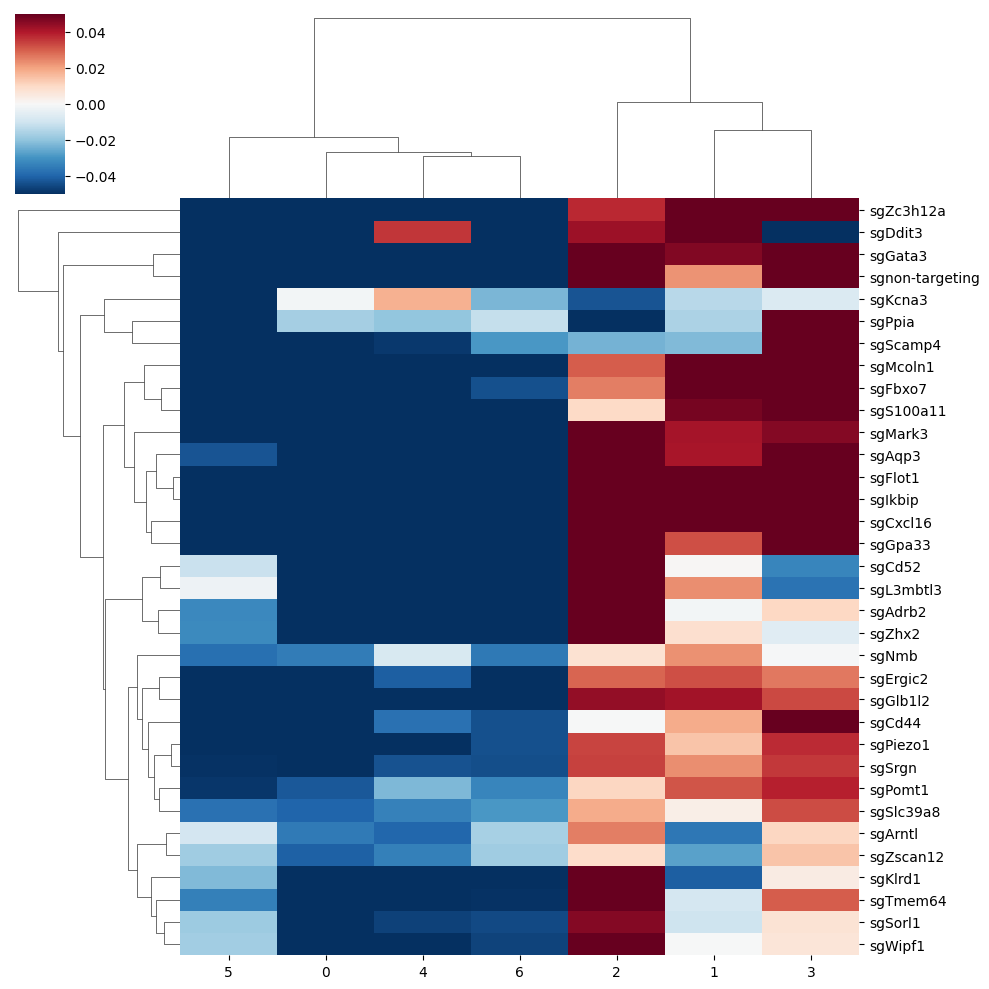

In [90]:
program_guide_matrix = np.zeros((guide_matrix.shape[0], program_matrix.shape[0]))
for i in range(guide_matrix.shape[0]):
    for j in range(program_matrix.shape[0]):
        program_guide_matrix[i, j] = spearmanr(guide_matrix[i, :], program_matrix[j, :])[0]
sns.clustermap(pd.DataFrame(program_guide_matrix, index=cdata.var_names, columns=list(range(7))), vmin=-0.05, vmax=0.05, cmap='RdBu_r')

In [89]:
gene_matrix = fdata[cdata.X.sum(axis=1) > 0, clustered_columns.column.tolist()].X.toarray().T
gene_matrix.shape

(819, 57070)

In [91]:
deg_guide_matrix = np.zeros((guide_matrix.shape[0], gene_matrix.shape[0]))
for i in tqdm(range(guide_matrix.shape[0])):
    for j in range(gene_matrix.shape[0]):
        deg_guide_matrix[i, j] = spearmanr(guide_matrix[i, :], gene_matrix[j, :])[0]

  0%|          | 0/34 [00:00<?, ?it/s]

100%|██████████| 34/34 [03:03<00:00,  5.40s/it]


In [ ]:
clustered_columns.cluster = clustered_columns.cluster.map({1: 1, 2: 1, 3: 2, 4: 3, 5: 4, 6: 4, 7: 4})

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


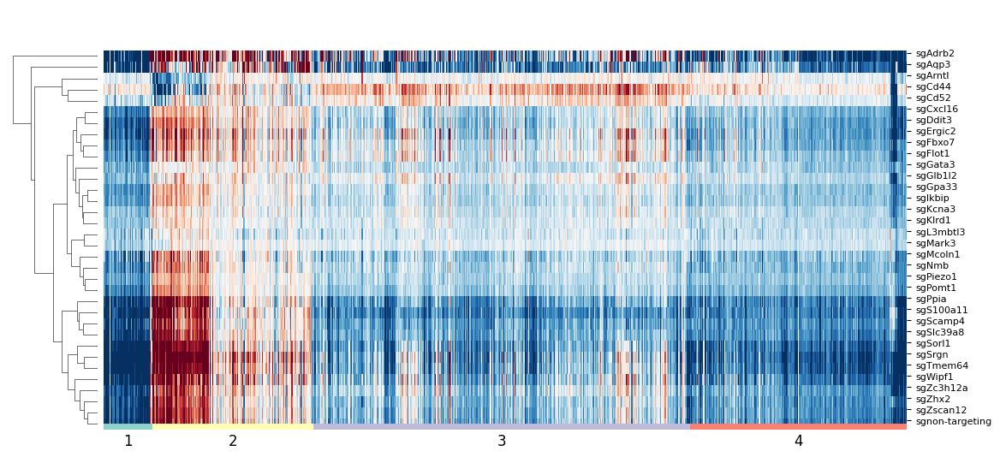

In [103]:
g = sns.clustermap(pd.DataFrame(deg_guide_matrix, index=cdata.var_names, columns=clustered_columns.column.tolist()),
    vmin=-0.05, vmax=0.07, cmap='RdBu_r', dendrogram_ratio=0.1, cbar_pos=None, figsize=(12, 6), col_cluster=False)
ax = g.ax_heatmap
ax.set_xticks([])
ax.set_yticks(np.array(list(range(len(cdata.var_names)))) + 0.2)
ax.set_yticklabels(cdata.var_names, size=8)

cluster_colors = sns.color_palette("Set3", len(np.unique(clustered_columns.cluster)))
for i, cluster in enumerate(np.unique(clustered_columns.cluster)):
    # Find columns belonging to this cluster
    cluster_cols = clustered_columns[clustered_columns['cluster'] == cluster].index
    
    # Draw a thick line on top of the columns in the cluster
    x_start = cluster_cols.min() - 0.5  # Left edge of the cluster
    x_end = cluster_cols.max() + 1.5    # Right edge of the cluster
    ax.hlines(y=34, xmin=x_start, xmax=x_end, color=cluster_colors[i], linewidth=10)  # Adjust y based on where you want the line
    # ax.vlines(x=1, ymin=x_start, ymax=x_end, color=cluster_colors[i], linewidth=6)  # Adjust y based on where you want the line
    
    # Add cluster label above the line
    ax.text((x_start + x_end) / 2, -0.05, str(cluster), ha='center', va='bottom', color='black', fontsize=12, transform=ax.get_xaxis_transform())
plt.show()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(


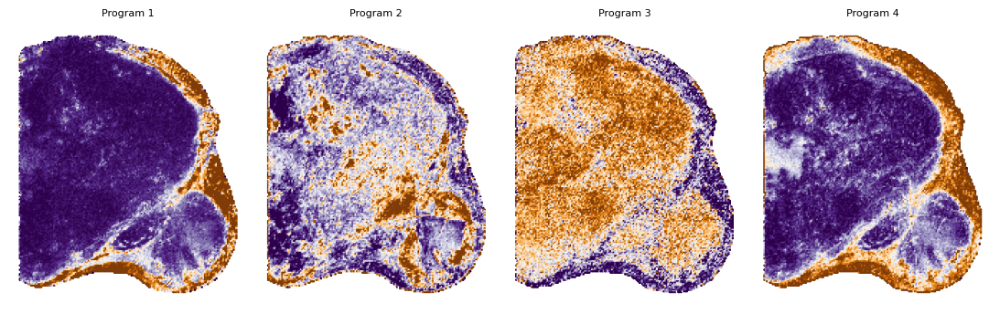

: 

In [117]:
plot_data = fdata[fdata.obs.marker == '2-1']
for cluster in np.unique(clustered_columns.cluster):
    genes = clustered_columns[clustered_columns.cluster == cluster].column.tolist()
    sc.tl.score_genes(plot_data, gene_list=genes, score_name=f'score_{cluster}')

_, ax = plt.subplots(1, 4, figsize=(14, 4))
for i, cluster in enumerate(np.unique(clustered_columns.cluster)):
    sq.pl.spatial_scatter(plot_data, shape=None, size=2, library_id='spatial', color=f'score_{cluster}', vmin=np.quantile(plot_data.obs[f'score_{cluster}'], 0.05), vmax=np.quantile(plot_data.obs[f'score_{cluster}'], 0.95), ax=ax[i],
                          colorbar=False, cmap='PuOr_r')
    ax[i].set_title(f'Program {cluster}', fontsize=8)
    sns.despine(left=True, bottom=True)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_xlabel('')
    ax[i].set_ylabel('')
plt.subplots_adjust(hspace=0.4, wspace=0)  # 调整ax之间的间距
plt.show()

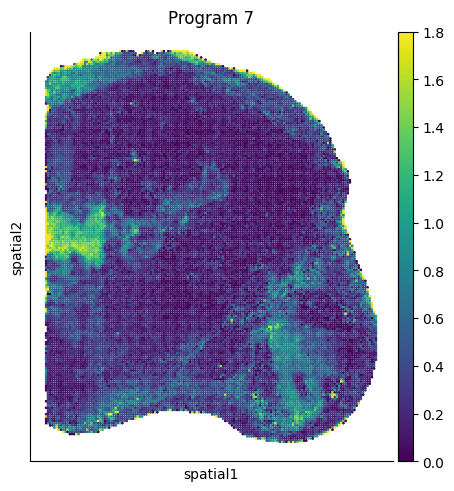

In [54]:
genes = clustered_columns[clustered_columns.cluster == 7].column.tolist()
sc.tl.score_genes(fdata, gene_list=genes, score_name='score')
sq.pl.spatial_scatter(fdata[fdata.obs.marker == '2-1'], shape=None, size=2, library_id='spatial', color='score', colorbar=True, vmin=0, vmax=1.8)
plt.title('Program 7')
sns.despine()

/tmp/ipykernel_46584/3987123192.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  gene_cluster_matrix = gene_cluster_matrix.groupby('cluster_cellcharter_givenk').mean()


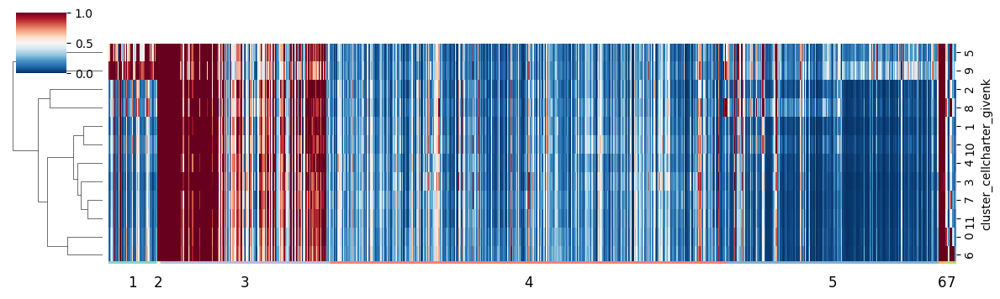

In [200]:
gene_matrix = pd.DataFrame(fdata[:, clustered_columns.column.tolist()].X.toarray(), index=fdata.obs_names, columns=clustered_columns.column.tolist())
gene_cluster_matrix = pd.concat([gene_matrix, fdata[cdata.X.sum(axis=1) > 0, :].obs.cluster_cellcharter_givenk], axis=1)
gene_cluster_matrix = gene_cluster_matrix.groupby('cluster_cellcharter_givenk').mean()

g = sns.clustermap(gene_cluster_matrix, cmap='RdBu_r', dendrogram_ratio=0.1, figsize=(12, 4), col_cluster=False, vmin=0, vmax=1)
ax = g.ax_heatmap
ax.set_xticks([])

for i, cluster in enumerate(np.unique(clustered_columns.cluster)):
    # Find columns belonging to this cluster
    cluster_cols = clustered_columns[clustered_columns['cluster'] == cluster].index
    
    # Draw a thick line on top of the columns in the cluster
    x_start = cluster_cols.min() - 0.5  # Left edge of the cluster
    x_end = cluster_cols.max() + 1.5    # Right edge of the cluster
    ax.hlines(y=12, xmin=x_start, xmax=x_end, color=cluster_colors[i], linewidth=5)  # Adjust y based on where you want the line
    # ax.vlines(x=1, ymin=x_start, ymax=x_end, color=cluster_colors[i], linewidth=6)  # Adjust y based on where you want the line
    
    # Add cluster label above the line
    ax.text((x_start + x_end) / 2, -0.12, str(cluster), ha='center', va='bottom', color='black', fontsize=12, transform=ax.get_xaxis_transform())
plt.show()

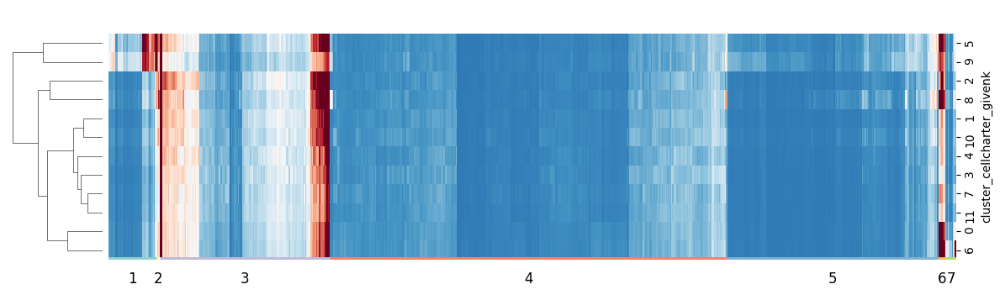

In [201]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage

# Iterate over each cluster and re-cluster rows within each
reordered_gene_matrix = []

for cluster in np.unique(clustered_columns.cluster):
    # Subset the data for each cluster
    sub_cluster_matrix = gene_cluster_matrix[clustered_columns[clustered_columns['cluster'] == cluster].column.tolist()]
    
    # Perform hierarchical clustering on the rows (within sub-cluster)
    col_linkage = linkage(sub_cluster_matrix.T, method='average')
    cluster_ind = fcluster(col_linkage, t=0.0001, criterion='distance')
    cluster_df = pd.DataFrame({
        'Gene': sub_cluster_matrix.columns.tolist(),
        'id': cluster_ind
    }).sort_values(by='id')

    # Reorder the matrix according to this new order
    reordered_sub_matrix = sub_cluster_matrix.loc[:,cluster_df.Gene.tolist()]
    
    # Append to the final reordered matrix
    reordered_gene_matrix.append(reordered_sub_matrix)

# Concatenate all reordered sub-clusters back into a single matrix
final_reordered_matrix = pd.concat(reordered_gene_matrix, axis=1)

# Plot the final heatmap with all sub-clustered data
g = sns.clustermap(final_reordered_matrix, cmap='RdBu_r', dendrogram_ratio=0.1, figsize=(12, 4), col_cluster=False, vmin=-0.5, vmax=3, cbar_pos=None)

# Add cluster lines and labels as before
ax = g.ax_heatmap
ax.set_xticks([])

for i, cluster in enumerate(np.unique(clustered_columns.cluster)):
    cluster_cols = clustered_columns[clustered_columns['cluster'] == cluster].index
    x_start = cluster_cols.min() - 0.5
    x_end = cluster_cols.max() + 1.5
    ax.hlines(y=12, xmin=x_start, xmax=x_end, color=cluster_colors[i], linewidth=5)
    ax.text((x_start + x_end) / 2, -0.12, str(cluster), ha='center', va='bottom', color='black', fontsize=12, transform=ax.get_xaxis_transform())

plt.show()

/tmp/ipykernel_46584/993484611.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cdf = cdf.groupby('cluster_cellcharter_givenk').mean().div(cdf.iloc[:, :-1].mean(axis=0))


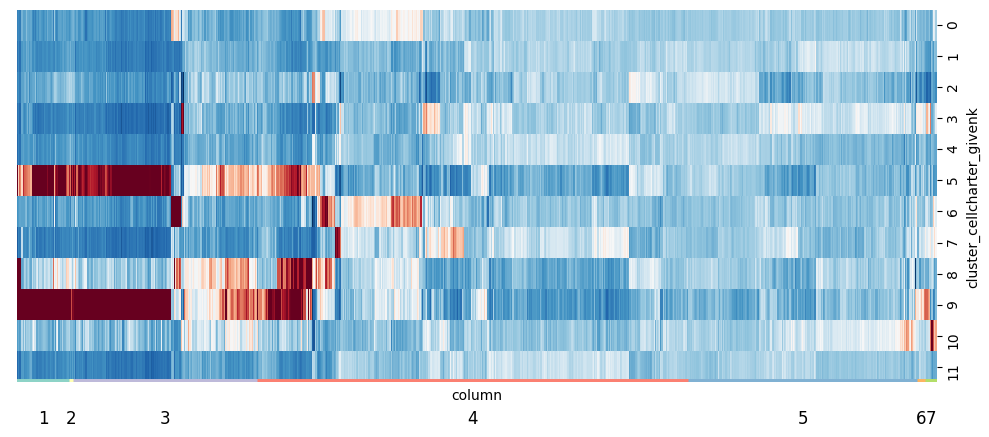

In [211]:
cdf = pd.concat([pd.DataFrame(fdata[:, clustered_columns.column].X.toarray(), index=fdata.obs_names), pd.DataFrame(fdata.obs.cluster_cellcharter_givenk)], axis=1)
cdf = cdf.groupby('cluster_cellcharter_givenk').mean().div(cdf.iloc[:, :-1].mean(axis=0))
cdf.columns = clustered_columns.column
cdf = cdf.loc[:,clustered_columns.column]
g = sns.clustermap(cdf, vmax=3, figsize=(10, 5), dendrogram_ratio=0.0001, cbar_pos=None, row_cluster=False, cmap='RdBu_r')
ax = g.ax_heatmap
ax.set_xticks([])
for i, cluster in enumerate(np.unique(clustered_columns.cluster)):
    cluster_cols = clustered_columns[clustered_columns['cluster'] == cluster].index
    x_start = cluster_cols.min() - 0.5
    x_end = cluster_cols.max() + 1.5
    ax.hlines(y=12, xmin=x_start, xmax=x_end, color=cluster_colors[i], linewidth=5)
    ax.text((x_start + x_end) / 2, -0.12, str(cluster), ha='center', va='bottom', color='black', fontsize=12, transform=ax.get_xaxis_transform())

plt.show()

In [38]:
# on bin level: count to all genes
mask = cdata.X.sum(axis=1) > 0
guide_matrix = cdata[cdata.X.sum(axis=1) > 0].X
# for ig in range(guide_matrix.shape[1]):
#     guide_matrix[:, ig] = guide_matrix[:, ig] / np.sum(guide_matrix[:, ig])
corr_matrix = np.zeros((guide_matrix.shape[1], len(degs)))
fdata_ = fdata[mask]
for idx, var in tqdm(enumerate(degs)):
    expr_vec = fdata_[:, var].X.toarray().flatten()
    for i in range(34):
        corr_matrix[i, idx] = spearmanr(expr_vec, guide_matrix[:, i])[0]

430it [05:40,  1.26it/s]


In [165]:
rho = spearmanr(np.hstack((guide_matrix, expr_matrix)), axis=0)[0]

In [166]:
rho = spearmanr(np.hstack((guide_matrix, expr_matrix)), axis=0)[0]
corr_matrix = rho[:guide_matrix.shape[1], guide_matrix.shape[1]:guide_matrix.shape[1]+expr_matrix.shape[1]]

In [167]:
corr_matrix.shape

(34, 500)

In [141]:
np.savetxt("./spearmanr.txt", corr_matrix, fmt="%6f")

In [4]:
corr_matrix = np.loadtxt("./spearmanr.txt")

In [168]:
np.sum(corr_matrix)

95.96600353084959

In [46]:
high_correlated_gene = []
low_correlated_gene = []
for i in range(34):
    guide_vec = corr_matrix[i]
    mu = np.mean(guide_vec)
    std = np.std(guide_vec)
    z = (guide_vec - mu) / std

    high_correlated = (z > np.quantile(z, 0.995))
    low_correlated = (z < np.quantile(z, 0.005))
    high_correlated_gene += (np.array(degs)[high_correlated].tolist())
    low_correlated_gene += (np.array(degs)[low_correlated].tolist())
high_correlated_gene = set(high_correlated_gene)
low_correlated_gene = set(low_correlated_gene)
print("high:", len(high_correlated_gene), ", low:", len(low_correlated_gene))

high: 36 , low: 24


In [51]:
high_correlated_gene = []
low_correlated_gene = []
for i in range(34):
    if cdata.var_names[i] != 'sgCd44': continue
    guide_vec = corr_matrix[i]
    mu = np.mean(guide_vec)
    std = np.std(guide_vec)
    z = (guide_vec - mu) / std

    high_correlated = (z > np.quantile(z, 0.95))
    low_correlated = (z < np.quantile(z, 0.05))
    high_correlated_gene += (np.array(degs)[high_correlated].tolist())
    low_correlated_gene += (np.array(degs)[low_correlated].tolist())
high_correlated_gene = set(high_correlated_gene)
low_correlated_gene = set(low_correlated_gene)
print("high:", len(high_correlated_gene), ", low:", len(low_correlated_gene))

high: 22 , low: 22


In [52]:
interest_gene = high_correlated_gene.union(low_correlated_gene)
interest_matrix = corr_matrix[:, np.isin(degs, list(interest_gene))]
interest_df = pd.DataFrame(interest_matrix)
interest_df.index = cdata.var_names
interest_df.columns = list(interest_gene)

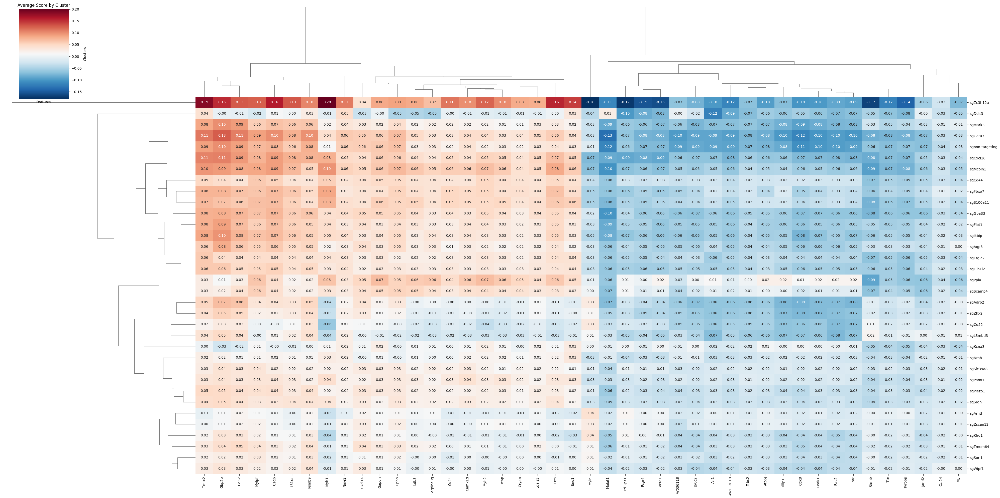

In [53]:
g = sns.clustermap(interest_df, annot=True, fmt=".2f", cmap="RdBu_r", figsize=(40, 20))

plt.title('Average Score by Cluster')
plt.xlabel('Features')
plt.ylabel('Clusters')
plt.show()

In [134]:
col_linkage = g.dendrogram_col.linkage
col_clusters = fcluster(col_linkage, 0.35, criterion="distance")
col_cluster_df = pd.DataFrame({
    'Gene': interest_df.columns,
    'Cluster': col_clusters
})
col_cluster_df.to_csv('DEG.csv', index=False, sep="\t")
np.unique(col_cluster_df["Cluster"])

array([1, 2, 3, 4, 5], dtype=int32)

In [140]:
col_cluster_df[col_cluster_df["Cluster"] == 5]

,Gene,Cluster
3,Cxcl10,5


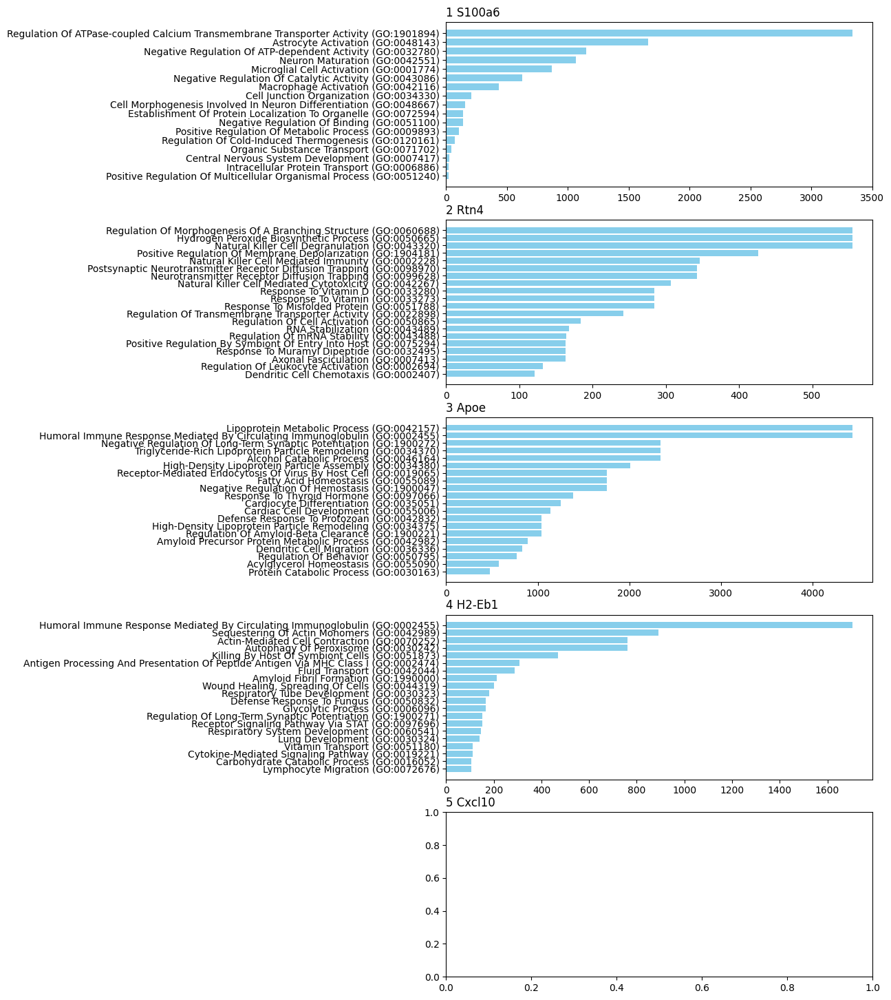

In [141]:
clusters = np.unique(col_cluster_df["Cluster"])
cluster_size = len(clusters)
fig = plt.figure(figsize=(8, 18))
for i in range(cluster_size):
    ax = plt.subplot(cluster_size, 1, i+1)
    plt.title(f"{clusters[i]}" + " " + f"{col_cluster_df[col_cluster_df["Cluster"] == clusters[i]].loc[:,"Gene"].iloc[0]}", loc="left")
    if i == 4: continue
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False).head(20)

    ax.barh(results['Term'], results['Combined Score'], color='skyblue')

    plt.gca().invert_yaxis()

# Program

In [ ]:
fdata[cdata.X.sum(axis=1) > 0, degs].var_names

# DEG bin

In [ ]:
cluster_deg = top_genes_df[top_genes_df["cluster"] == "5"]["Gene"]
guide_matrix = cdata.X
expr_matrix = fdata[:, cluster_deg].X.toarray()

In [ ]:
rho = spearmanr(np.hstack((guide_matrix, expr_matrix)), axis=0)[0]
corr_matrix = rho[:guide_matrix.shape[1], guide_matrix.shape[1]:guide_matrix.shape[1]+expr_matrix.shape[1]]

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


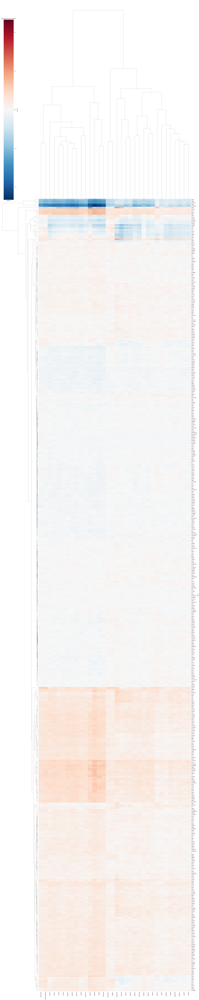

In [169]:
corr_df = pd.DataFrame(corr_matrix[:, ~np.isnan(corr_matrix[0])], columns=cluster_deg[~np.isnan(corr_matrix[0])], index=cdata.var_names)
g = sns.clustermap(corr_df.T, annot=False, fmt="", cmap="RdBu_r", figsize=(30, 150), norm=mcolors.CenteredNorm(vcenter=0.0))

plt.title('Average Score by Cluster')
plt.xlabel('Features')
plt.ylabel('Clusters')
plt.show()

# DEG

In [157]:
pval_cutoff = 0.01
top_n = 500

result = fdata.uns['rank_genes_groups']
groups = result['names'].dtype.names

top_genes_df = pd.DataFrame()

for group in groups:
    genes = result['names'][group]
    log2fc = result['logfoldchanges'][group]
    padj = result['pvals_adj'][group]
    score = result['scores'][group]
    
    data = pd.DataFrame({
        'Gene': genes,
        'Log2FoldChange': log2fc,
        'padj': padj,
        'score': score,
        'cluster': group
    })
    
    filtered_data = data[data['padj'] < 0.01]
    sorted_data = filtered_data.sort_values(by='score', ascending=False)
    top_genes = sorted_data.head(top_n)
    top_genes_df = pd.concat([top_genes_df, top_genes], ignore_index=True)

deg = top_genes_df["Gene"].unique().tolist()
top_genes_df.to_csv('DEG.csv', index=False, sep="\t")
top_genes_df

,Gene,Log2FoldChange,padj,score,cluster
0,S100a6,0.705705,0.000000e+00,88.272202,0
1,Spp1,1.079456,0.000000e+00,72.598366,0
2,H2-D1,0.454569,0.000000e+00,69.911057,0
3,Pabpc1,0.957705,0.000000e+00,69.342979,0
4,Krt18,1.343269,0.000000e+00,66.212166,0
...,...,...,...,...,...
5995,Myl6b,2.734031,1.375100e-65,17.460184,11
5996,Atp6v0e2,2.805928,2.658820e-65,17.421448,11
5997,Chl1,1.355111,2.680902e-65,17.409033,11
5998,Cobl,2.503455,4.236862e-65,17.391464,11


In [104]:
guide_matrix = cdata.X
expr_matrix = fdata[:, deg].X.toarray()

rho = spearmanr(np.hstack((guide_matrix, expr_matrix)), axis=0)[0]
corr_matrix = rho[:guide_matrix.shape[1], guide_matrix.shape[1]:guide_matrix.shape[1]+expr_matrix.shape[1]]

corr_matrix.shape

(34, 3352)

In [107]:
high_correlated_gene = []
low_correlated_gene = []
for i in range(34):
    guide_vec = corr_matrix[i]
    mu = np.mean(guide_vec)
    std = np.std(guide_vec)
    z = (guide_vec - mu) / std

    high_correlated = (z > np.quantile(z, 0.99))
    low_correlated = (z < np.quantile(z, 0.01))
    high_correlated_gene += (fdata[:, deg].var_names[high_correlated].tolist())
    low_correlated_gene += (fdata[:, deg].var_names[low_correlated].tolist())
high_correlated_gene = set(high_correlated_gene)
low_correlated_gene = set(low_correlated_gene)
print("high:", len(high_correlated_gene), ", low:", len(low_correlated_gene))

high: 117 , low: 156


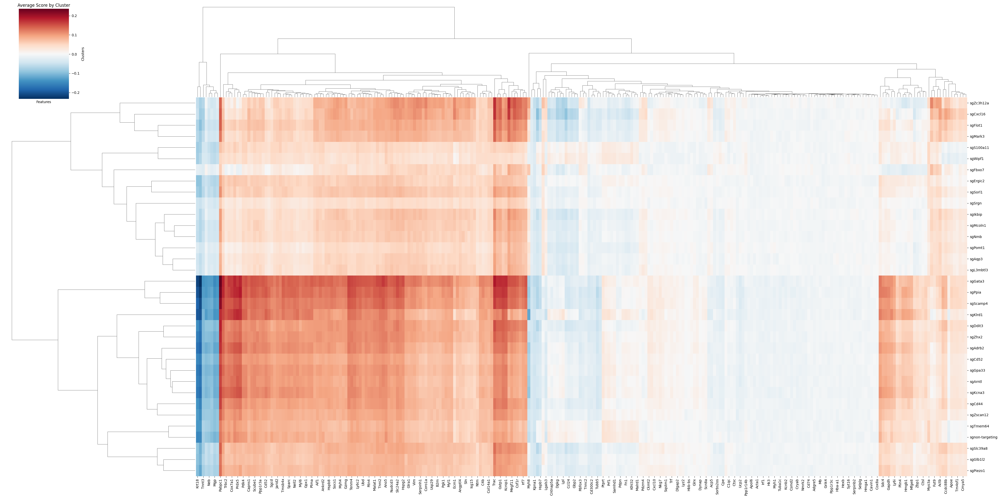

In [72]:
interest_gene = high_correlated_gene.union(low_correlated_gene)
interest_matrix = corr_matrix[:, np.isin(fdata[:, deg].var_names, list(interest_gene))]
interest_df = pd.DataFrame(interest_matrix)
interest_df.index = cdata.var_names
interest_df.columns = list(interest_gene)

g = sns.clustermap(interest_df, annot=False, fmt="", cmap="RdBu_r", figsize=(40, 20))

plt.title('Average Score by Cluster')
plt.xlabel('Features')
plt.ylabel('Clusters')
plt.show()

In [113]:
col_linkage = g.dendrogram_col.linkage
col_clusters = fcluster(col_linkage, 0.22, criterion="distance")
col_cluster_df = pd.DataFrame({
    'Gene': interest_df.columns,
    'Cluster': col_clusters
})
col_cluster_df.to_csv('DEG.csv', index=False, sep="\t")
np.unique(col_cluster_df["Cluster"])

array([1, 2, 3, 4, 5, 6, 7, 8], dtype=int32)

In [114]:
col_cluster_df[col_cluster_df["Cluster"] == 5]

,Gene,Cluster
0,Asic2,5
1,Gbp2b,5
3,Ccl24,5
4,Psap,5
5,Rac2,5
...,...,...
252,Dmd,5
253,Ncf1,5
264,Acp5,5
265,Actc1,5


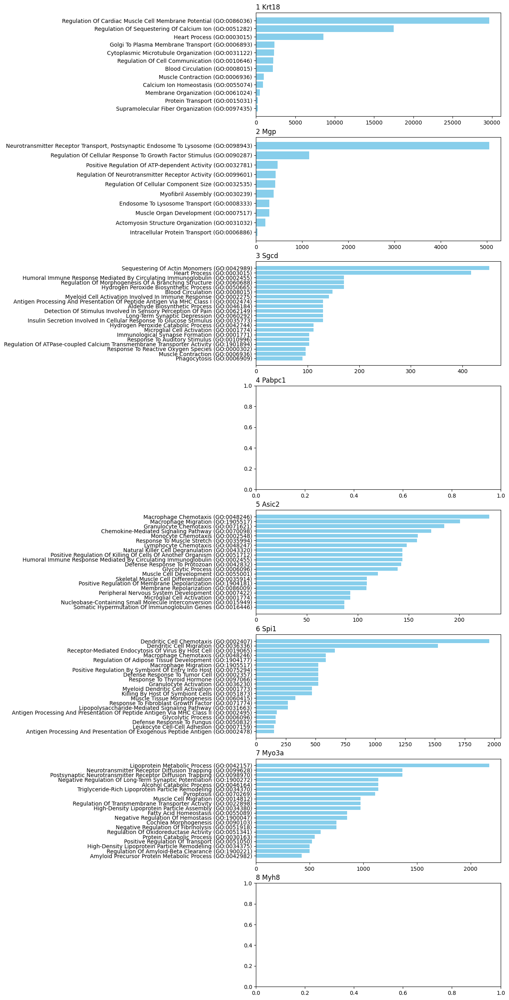

In [116]:
clusters = np.unique(col_cluster_df["Cluster"])
fig = plt.figure(figsize=(8, 32))
for i in range(8):
    ax = plt.subplot(8, 1, i+1)
    plt.title(f"{clusters[i]}" + " " + f"{col_cluster_df[col_cluster_df["Cluster"] == clusters[i]].loc[:,"Gene"].iloc[0]}", loc="left")
    if i == 3 or i == 7: continue
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False).head(20)

    ax.barh(results['Term'], results['Combined Score'], color='skyblue')

    plt.gca().invert_yaxis()

# Time-Cluster specific

In [54]:
pval_cutoff = 0.01
top_n = 500

result = fdata.uns['rank_genes_groups']
groups = result['names'].dtype.names

top_genes_df = pd.DataFrame()

for group in groups:
    genes = result['names'][group]
    log2fc = result['logfoldchanges'][group]
    padj = result['pvals_adj'][group]
    score = result['scores'][group]
    
    data = pd.DataFrame({
        'Gene': genes,
        'Log2FoldChange': log2fc,
        'padj': padj,
        'score': score,
        'cluster': group
    })
    
    filtered_data = data[data['padj'] < 0.01]
    sorted_data = filtered_data.sort_values(by='score', ascending=False)
    top_genes = sorted_data.head(top_n)
    top_genes_df = pd.concat([top_genes_df, top_genes], ignore_index=True)

deg = top_genes_df["Gene"].unique().tolist()
top_genes_df.to_csv('DEG.csv', index=False, sep="\t")
top_genes_df

,Gene,Log2FoldChange,padj,score,cluster
0,Il31ra,1.698707,0.000000e+00,45.774677,0
1,Cd44,1.405137,0.000000e+00,43.589825,0
2,Malat1,1.234776,0.000000e+00,42.706799,0
3,Hexb,0.913633,2.934200e-306,38.552090,0
4,Camk1d,1.695040,4.706520e-295,37.549950,0
...,...,...,...,...,...
5995,Adgre5,0.184811,2.159623e-22,9.989098,11
5996,Nomo1,0.237841,2.634026e-22,9.968628,11
5997,Extl2,0.414906,2.823627e-22,9.963871,11
5998,Cldnd1,0.360339,3.001915e-22,9.957489,11


In [56]:
time_point = '2-1'
cluster_id = 3
cluster_deg = top_genes_df[top_genes_df["cluster"] == f"{cluster_id}"]["Gene"]

guide_matrix = cdata[(fdata.obs["marker"] == f"{time_point}") & (fdata.obs["cluster_cellcharter_givenk"] == cluster_id)].X.toarray()
expr_matrix = fdata[(fdata.obs["marker"] == f"{time_point}") & (fdata.obs["cluster_cellcharter_givenk"] == cluster_id), cluster_deg].X.toarray()

In [57]:
rho = spearmanr(np.hstack((guide_matrix, expr_matrix)), axis=0)[0]
corr_matrix = rho[:guide_matrix.shape[1], guide_matrix.shape[1]:guide_matrix.shape[1]+expr_matrix.shape[1]]

In [64]:
high_correlated_gene = []
low_correlated_gene = []
for i in range(34):
    guide_vec = corr_matrix[i]
    mu = np.mean(guide_vec)
    std = np.std(guide_vec)
    z = (guide_vec - mu) / std

    high_correlated = (z > np.quantile(z, 0.999))
    low_correlated = (z < np.quantile(z, 0.001))
    high_correlated_gene += (np.array(cluster_deg)[high_correlated].tolist())
    low_correlated_gene += (np.array(cluster_deg)[low_correlated].tolist())
high_correlated_gene = set(high_correlated_gene)
low_correlated_gene = set(low_correlated_gene)
print("high:", len(high_correlated_gene), ", low:", len(low_correlated_gene))

high: 33 , low: 29


In [65]:
interest_gene = high_correlated_gene.union(low_correlated_gene)
interest_matrix = corr_matrix[:, np.isin(cluster_deg, list(interest_gene))]
interest_df = pd.DataFrame(interest_matrix)
interest_df.index = cdata.var_names
interest_df.columns = list(interest_gene)

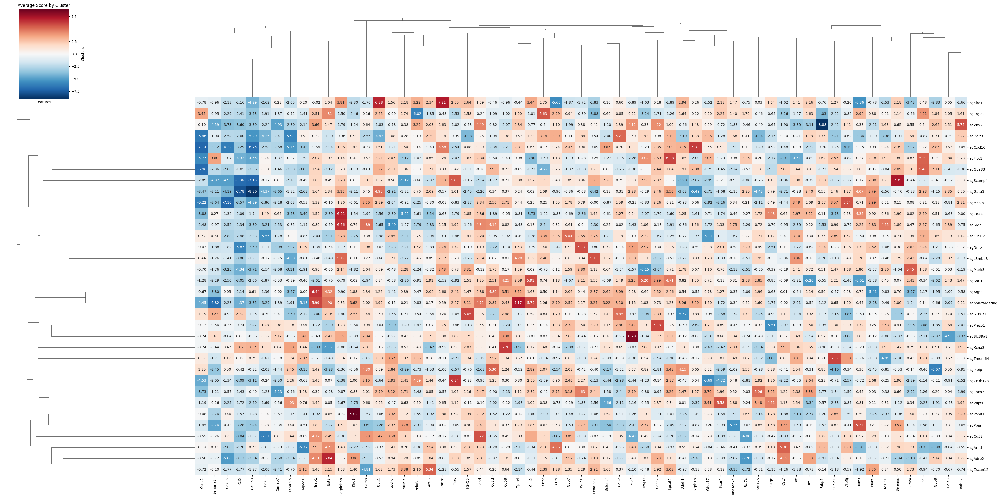

In [71]:
corr_df = pd.DataFrame(corr_matrix[:, ~np.isnan(corr_matrix[0])] * 100, columns=cluster_deg[~np.isnan(corr_matrix[0])], index=cdata.var_names)
g = sns.clustermap(interest_df * 100, annot=True, fmt=".2f", cmap="RdBu_r", figsize=(40, 20), norm=mcolors.CenteredNorm(vcenter=0.0))

plt.title('Average Score by Cluster')
plt.xlabel('Features')
plt.ylabel('Clusters')
plt.show()

Text(0.5, 1.0, 'KDE of Spp1+ Macrophage')

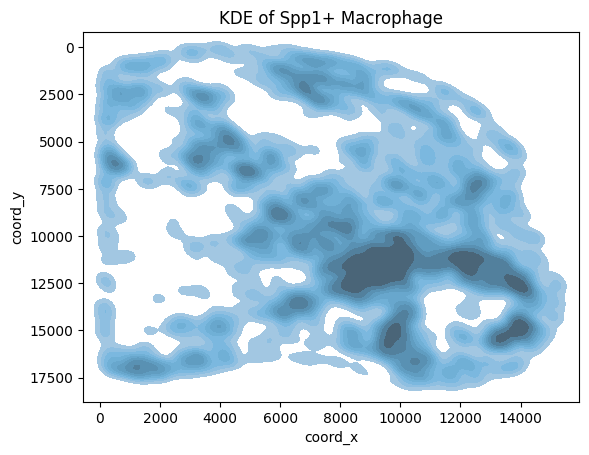

In [98]:
fdata_ = fdata[fdata.obs.marker == '2-1']
fdata_ = fdata_[fdata_[:, ['C1qc', 'C1qb', 'Spp1']].X.sum(axis=1) > 4]
s_df = pd.DataFrame({
    'coord_x': fdata_.obsm['spatial'][:, 0],
    'coord_y': fdata_.obsm['spatial'][:, 1],
    'hue': [1] * fdata_.shape[0]
})

fig, ax = plt.subplots(1, 1)
# sq.pl.spatial_scatter(fdata_, color='shannon', shape=None, size=0, library_id='spatial', ax=ax)
sns.kdeplot(s_df, x='coord_x', y='coord_y', fill=True, bw_adjust=0.25, ax=ax, alpha=1, hue='hue', palette='Blues', legend=False)
plt.gca().invert_yaxis()
plt.title('KDE of Spp1+ Macrophage')

# Cluster specific

In [39]:
# proportion matrix for each gene and cluster
cdata.obs["cluster_cellcharter_givenk"] = fdata.obs["cluster_cellcharter_givenk"].tolist()
guide_cluster_counts = pd.DataFrame(cdata.X)
guide_cluster_counts.columns = cdata.var_names
guide_cluster_counts["cluster"] = cdata.obs["cluster_cellcharter_givenk"].tolist()

guide_total_counts = guide_cluster_counts.sum(axis=0)[:-1]
guide_cluster_proportions = guide_cluster_counts.groupby(["cluster"]).sum()
guide_cluster_proportions = guide_cluster_proportions.div(guide_total_counts, axis=1)
guide_cluster_proportions.index = guide_cluster_proportions.index.astype(int)
guide_cluster_proportions = guide_cluster_proportions.T.reindex(sorted(guide_cluster_proportions.index), axis=1)
for i in range(12): guide_cluster_proportions[i] = guide_cluster_proportions.convert_dtypes().loc[:, i].astype(float).to_list()
ntc_guide_counts = guide_cluster_proportions.iloc[-1]
guide_cluster_proportions = guide_cluster_proportions - ntc_guide_counts

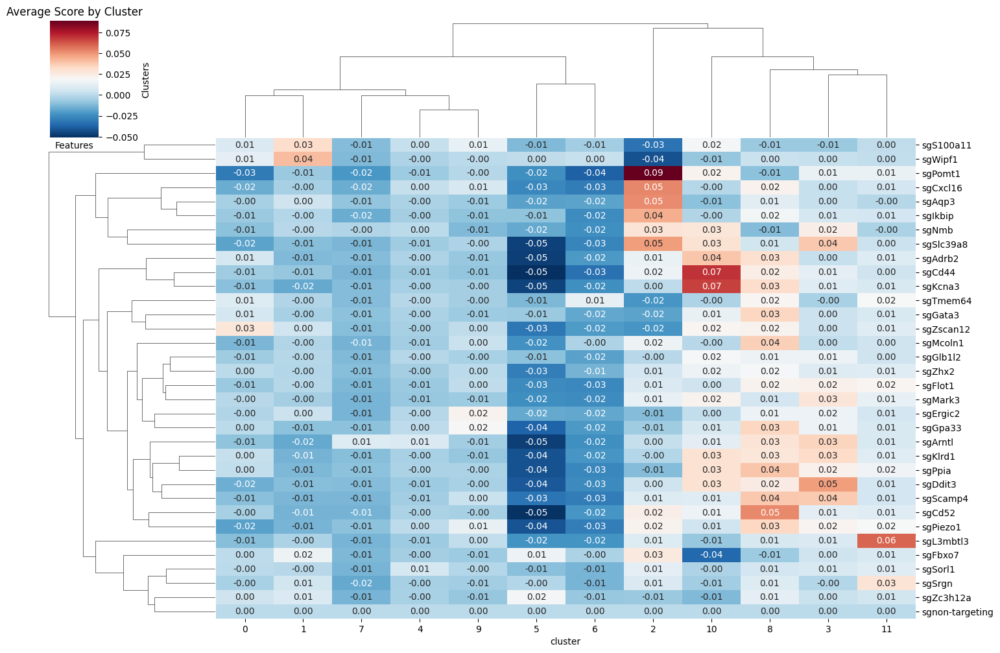

In [40]:
sns.clustermap(guide_cluster_proportions, annot=True, fmt=".2f", cmap="RdBu_r", figsize=(15, 10))

plt.title('Average Score by Cluster')
plt.xlabel('Features')
plt.ylabel('Clusters')
plt.show()

In [149]:
cluster_id = 7
cluster_deg = top_genes_df[top_genes_df["cluster"] == f"{cluster_id}"]["Gene"]

guide_matrix = cdata[fdata.obs["cluster_cellcharter_givenk"] == cluster_id].X.toarray()
expr_matrix = fdata[fdata.obs["cluster_cellcharter_givenk"] == cluster_id, cluster_deg].X.toarray()

In [150]:
rho, rho_p = spearmanr(np.hstack((guide_matrix, expr_matrix)), axis=0)
corr_matrix = rho[:guide_matrix.shape[1], guide_matrix.shape[1]:guide_matrix.shape[1]+expr_matrix.shape[1]]
p_matrix = rho_p[:guide_matrix.shape[1], guide_matrix.shape[1]:guide_matrix.shape[1]+expr_matrix.shape[1]]

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


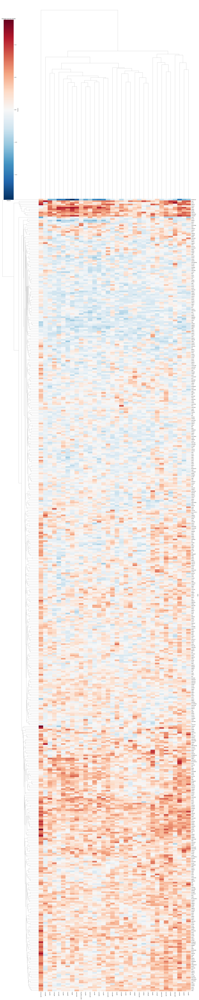

In [151]:
corr_df = pd.DataFrame(corr_matrix[:, ~np.isnan(corr_matrix[0])], columns=cluster_deg[~np.isnan(corr_matrix[0])], index=cdata.var_names)
g = sns.clustermap(corr_df.T, annot=False, fmt="", cmap="RdBu_r", figsize=(30, 150), norm=mcolors.CenteredNorm(vcenter=0.0))

plt.title('Average Score by Cluster')
plt.xlabel('Features')
plt.ylabel('Clusters')
plt.show()

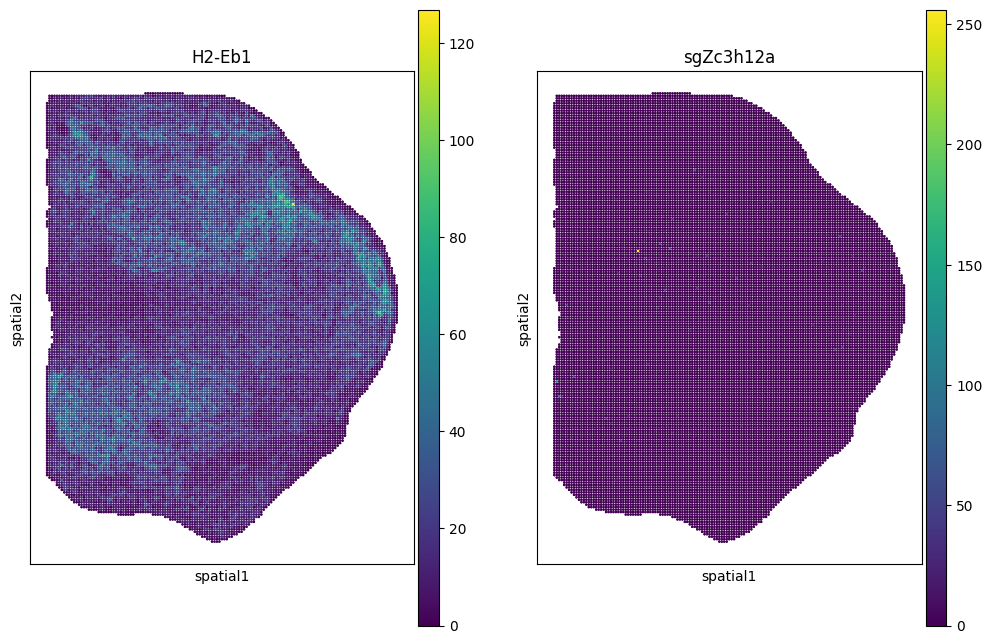

In [48]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8))
sq.pl.spatial_scatter(fdata[fdata.obs["time_point"] == "1"], color="H2-Eb1", shape=None, size=2, library_id="spatial", layer="counts", ax=ax[0])
sq.pl.spatial_scatter(cdata[cdata.obs["time_point"] == "1"], color="sgZc3h12a", shape=None, size=2, library_id="spatial", ax=ax[1])

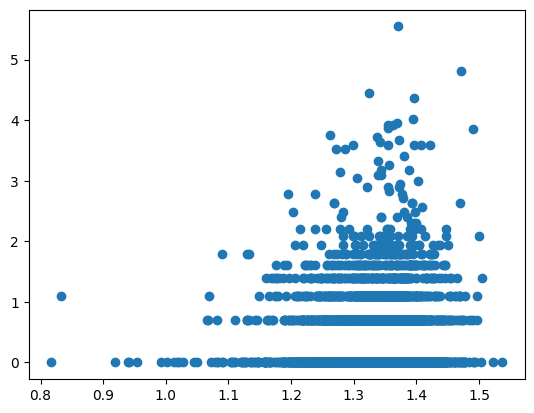

In [66]:
x = np.log(fdata[fdata.obs["time_point"] == "1", "B2m"].X.toarray().flatten() + 1e-9)
y = np.log(cdata[cdata.obs["time_point"] == "1", "sgZc3h12a"].X.toarray().flatten() + 1e-9)
where = (x > -5) & (y > -5)
x = x[where]
y = y[where]
plt.scatter(x, y)
plt.show()

In [155]:
row_linkage = g.dendrogram_row.linkage
row_clusters = fcluster(row_linkage, 0.25, criterion="distance")
row_cluster_df = pd.DataFrame({
    'Gene': corr_df.columns,
    'Cluster': row_clusters
})
row_cluster_df.to_csv('DEG.csv', index=False, sep="\t")
row_cluster_df.groupby("Cluster").count()

,Gene
Cluster,
1,10
2,481
3,1


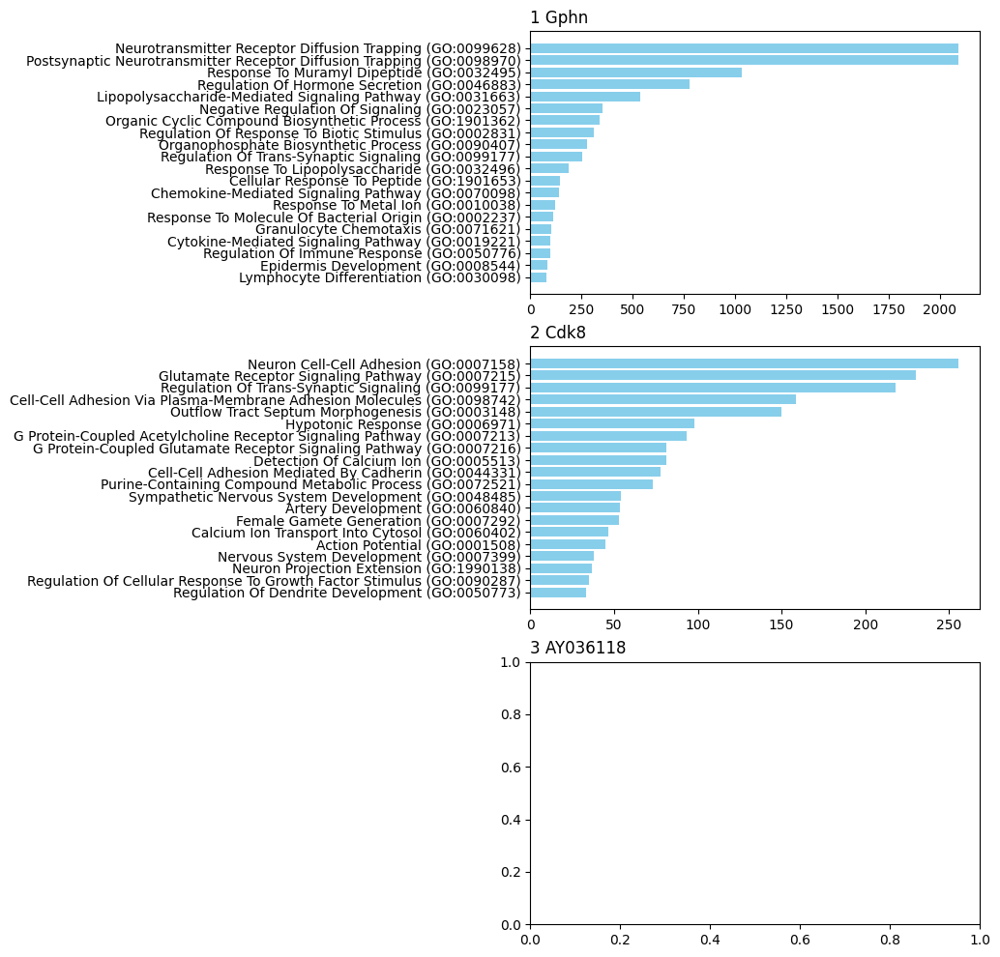

In [156]:
clusters = np.unique(row_cluster_df["Cluster"])
n_clusters = len(clusters)
fig = plt.figure(figsize=(6, n_clusters * 4))
for i in range(n_clusters):
    ax = plt.subplot(n_clusters, 1, i+1)
    plt.title(f"{clusters[i]}" + " " + f"{row_cluster_df[row_cluster_df["Cluster"] == clusters[i]].loc[:,"Gene"].iloc[0]}", loc="left")
    if i == 2: continue
    enr = pd.read_csv(f"./GO/Cluster_{i}.result", sep="\t")
    results = enr.sort_values(by='Combined Score', ascending=False).head(20)

    ax.barh(results['Term'], results['Combined Score'], color='skyblue')

    plt.gca().invert_yaxis()